# Difference of Gaussians and scikit-image's path_through_array

Author: Dan Shaked-Renous
<br> <br>
This notebook aims to demonstrate a proof of concept of a new method of weld edge detection and segmentation based on calculating the difference of two Guassian blurring and the application of the scikit-image method path_through_array. <br>
The presented work was done in collaboration with Sarah Shannon (notebook `sarah_dog.ipynb`).<br><br>

The method relies on finding the reference line location on each side of the weld, as they serve as the start and end points of the path to find.<br>
In addition, we apply also path searching from left to right and from right to left. Large discrepancies may indicate on faulty measurements. <br>
This is not a silver-bullet and might work better for other images by combining this method with the masks from the upsharp method.

In [6]:
import os
from os import listdir
from os.path import isfile, join
import sys
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from skimage import io
from skimage.color import rgb2gray, rgb2hsv

sys.path.append(os.pardir + '/src/data')

import segment_image as si
import numpy as np
from skimage.filters import difference_of_gaussians, window
import skimage.graph
import cv2


In this code we used some help from

https://stackoverflow.com/questions/13226394/how-to-normalize-difference-of-gaussian-image-pixels-with-negative-values

In [7]:
HOME = '../data/interim/merged_data/not_measured/'

In [8]:
def differenceOfGaussians(image, gaussian1, gaussian2):
  
    g1 = cv2.GaussianBlur(image, (0, 0), gaussian1, gaussian1)
    g2 = cv2.GaussianBlur(image, (0, 0), gaussian2, gaussian2)
    filtered_image = g1 -g2

    # replace all negative values with zero - gives black image
    filtered_image[filtered_image < 0] = 0

    # need to scale the magnitude of the values to enhance the detail at the low end
    filtered_image = filtered_image * 300

    # Convert the image to a 0-255 scale.
    filtered_image = 255 * filtered_image
    filtered_image[filtered_image > 255] = 255

    # Convert to integer data type pixels.
    filtered_image = filtered_image.astype(np.uint8)

    filtered_image = filtered_image.astype(bool)
    
    return result

In [9]:
def get_weld_edges(fname, hough_line, 
                   gauss1=1, gauss2=6,
                   buffer=0, flipped=False,
                   start=0, end=0):
    image = io.imread(HOME+fname)

    image= si.cut_scale_off(image)
    image= rgb2gray(image)
    
    filtered_image = differenceOfGaussians(image, gauss1, gauss2) 

    # replace all negative values with zero - gives black image
    filtered_image[filtered_image < 0] = 0

    # need to scale the magnitude of the values to enhance the detail at the low end
    filtered_image = filtered_image * 300

    # Convert the image to a 0-255 scale.
    filtered_image = 255 * filtered_image
    filtered_image[filtered_image > 255] = 255

    # Convert to integer data type pixels.
    filtered_image = filtered_image.astype(np.uint8)

    filtered_image = filtered_image.astype(bool)
    
    hl_l, hl_r = hough_line 
    
    
    # Extracting the top edge
    if flipped:
        end = (hl_l, buffer)
        start = (hl_r, image.shape[1]-(buffer+1))
    else:    
        start = (hl_l, buffer)
        end = (hl_r, image.shape[1]-(buffer+1))
    cutting_point = max([start[0], end[0]]) + 10

    path, _ = skimage.graph.route_through_array(filtered_image[:cutting_point], start, end, fully_connected=False, geometric=False)
    path_top = np.array(path).transpose()
    
    # Extracting the bottom edge
    cutting_point = min([start[0], end[0]]) - 10
    start = (start[0] - cutting_point, start[1])
    end = (end[0] - cutting_point, end[1])

    path, _ = skimage.graph.route_through_array(filtered_image[cutting_point:], start, end, fully_connected=False, geometric=False)
    path_bottom = np.array(path).transpose()
    
    # converting back to original coordinates
    path_bottom[0] = path_bottom[0] + cutting_point
    
    return path_top, path_bottom
    
    

In [10]:
fname = '2O-A21_10x.jpg'
image = io.imread(HOME+fname)

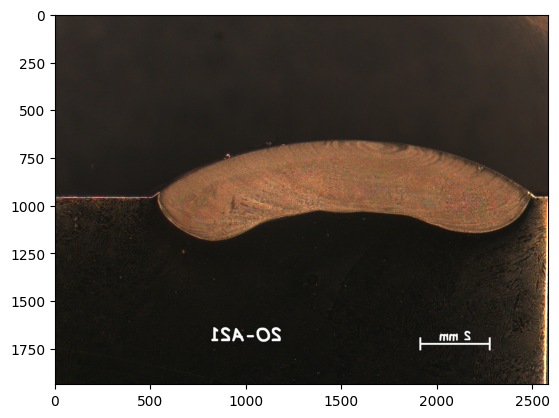

In [11]:
plt.imshow(np.fliplr(image))

In [12]:
images = ['1M-A31N_10x.jpg','4E-A13_10x.jpg','2O-A21_10x.jpg','1B-A11N_10x.jpg', '1B-A12_10x.jpg',
           '1B-A13_10x.jpg', '1B-B1N_10x.jpg', '1E-A33_10x.jpg',
           '1F-A23_8x.jpg', '1F-B2_10x.jpg', '1M-A11N_10x.jpg',
           '1M-B2_10x.jpg', '1O-A32_8x.jpg']

In [13]:
df = pd.read_csv('../data/interim/cropped_contouredv3/additional_coordinates.csv')

In [14]:
df.hline_left[df.image_file_name == "1M-A31N_10x.jpg"]=960

/home/dan_s/.local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


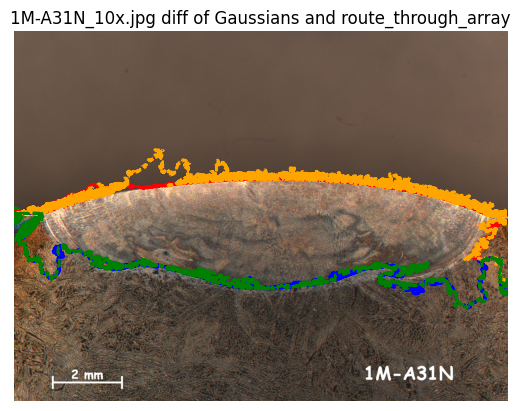

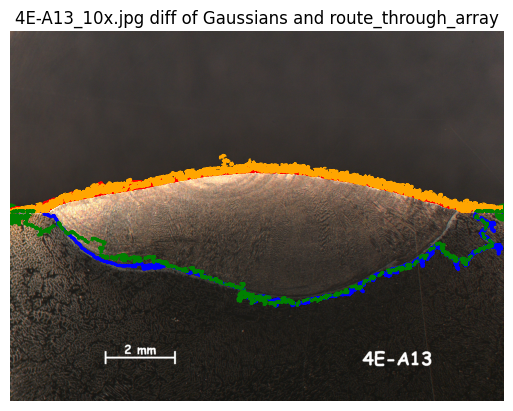

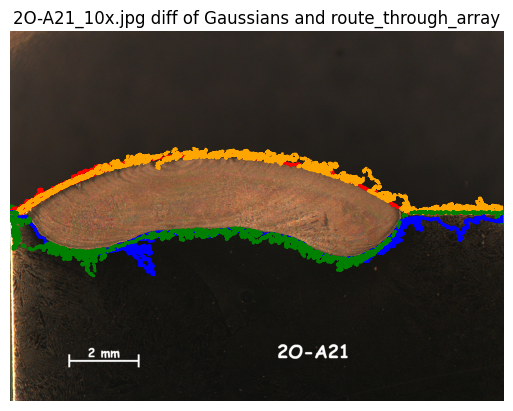

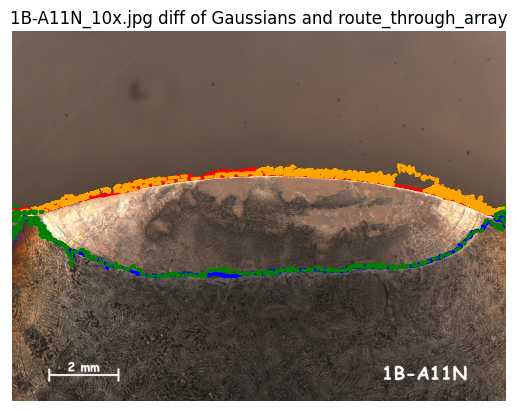

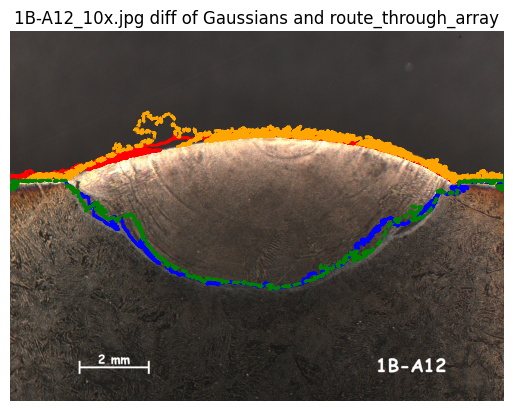

...

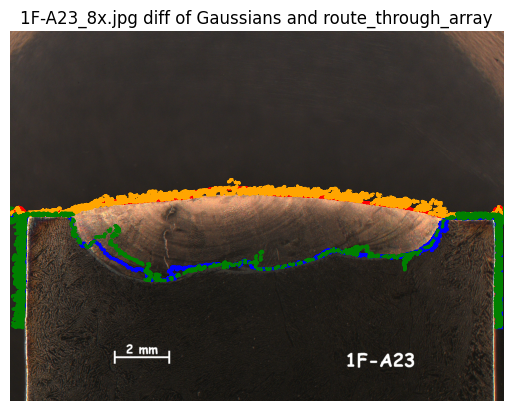

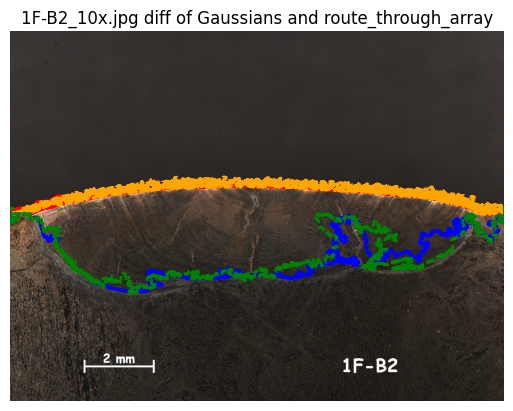

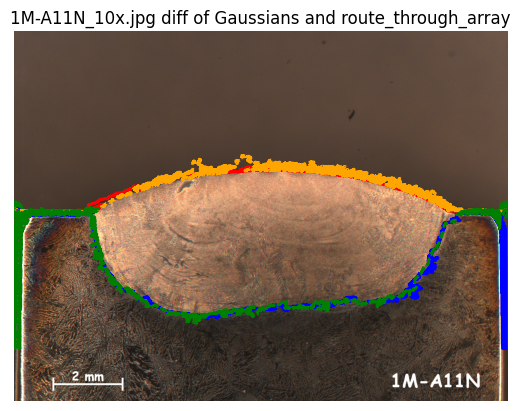

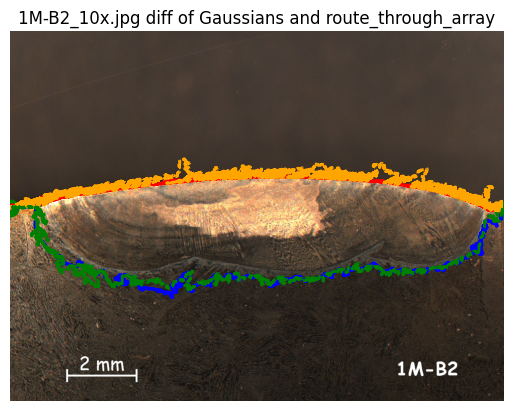

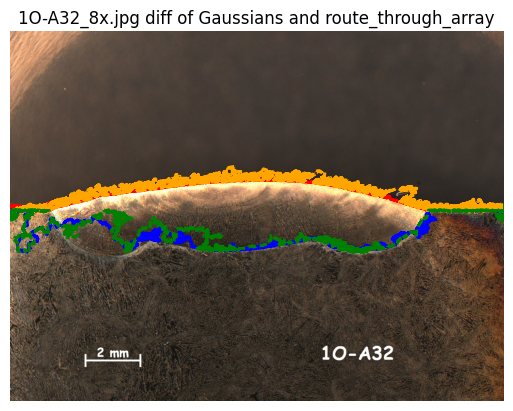

In [15]:

for fname in images:
    g1 = 1
    g2 = 18
    hl_l = df.hline_left[df.image_file_name == fname].values[0]
    hl_r = df.hline_right[df.image_file_name == fname].values[0]
    if hl_l < 500:
        hl_l, hl_r = 960, 960
    p_top, p_bottom = get_weld_edges(fname, (hl_l, hl_r), gauss1=g1, gauss2=g2)
    p_top_f, p_bottom_f = get_weld_edges(fname, (hl_l, hl_r), gauss1=g1, gauss2=g2, flipped=True)

    image = io.imread(HOME+fname)
    
    plt.imshow(image)


    plt.title('{} diff of Gaussians and route_through_array'.format(fname)) 
    plt.plot(p_top[1][0], p_top[0][0], 'go', markersize=12)
    plt.plot(p_top[1][-1], p_top[0][-1], 'go', markersize=12)

    plt.plot(p_top[1], p_top[0], linewidth=2, color='red')
    plt.plot(p_bottom[1], p_bottom[0], linewidth=2, color='blue')
    plt.plot(p_top_f[1], p_top_f[0], '--',linewidth=2, color='orange')
    plt.plot(p_bottom_f[1], p_bottom_f[0], '--', linewidth=2, color='green')
    plt.axis('off')
    plt.show()

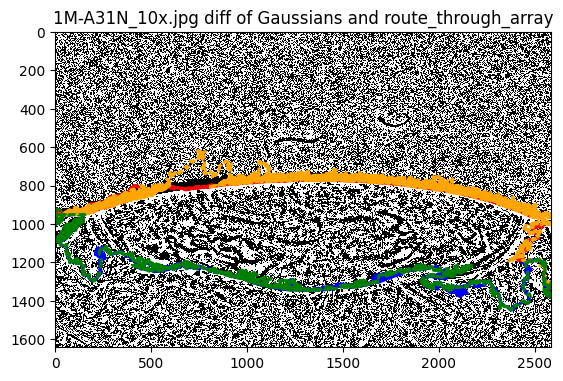

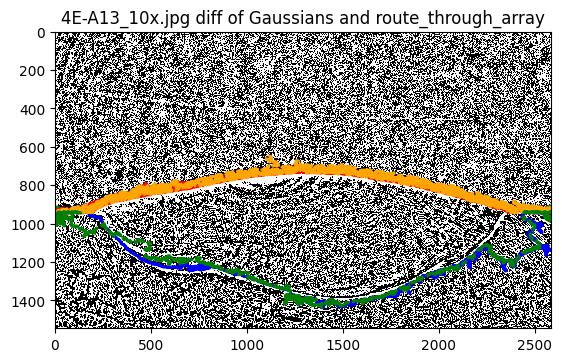

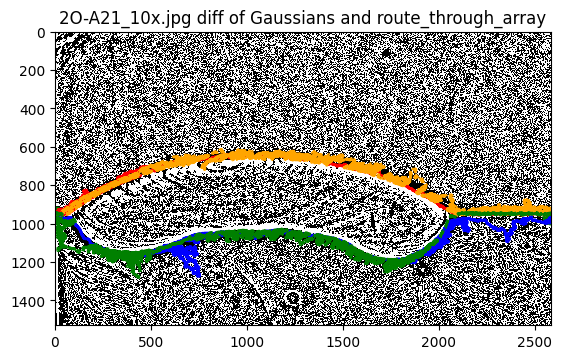

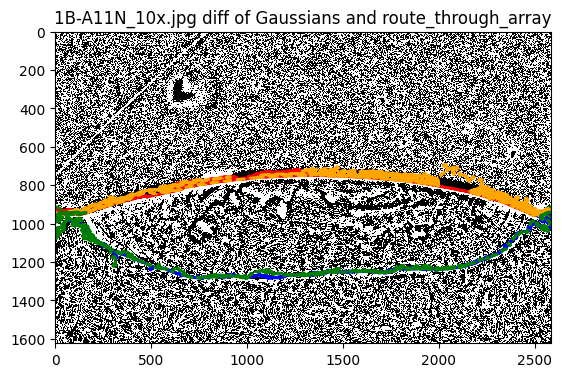

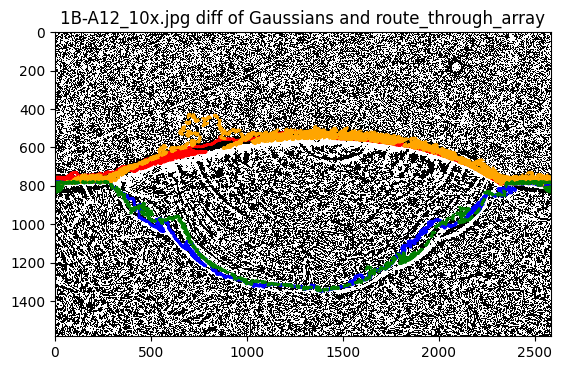

...

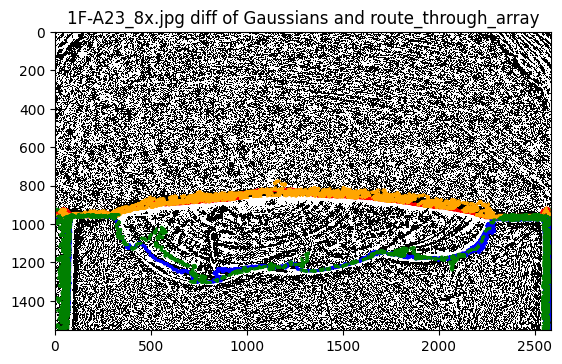

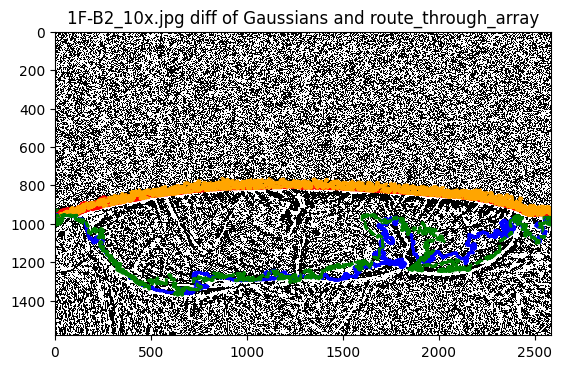

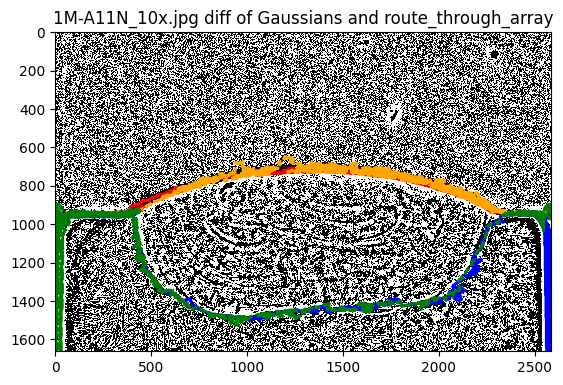

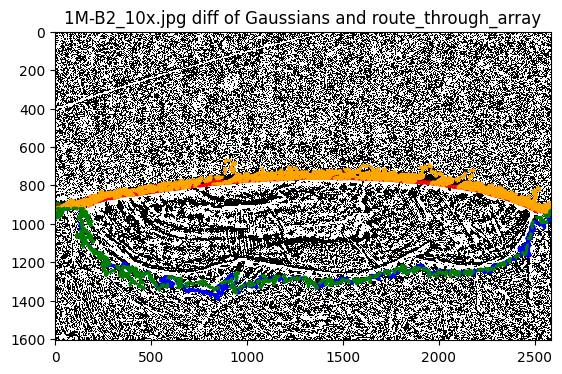

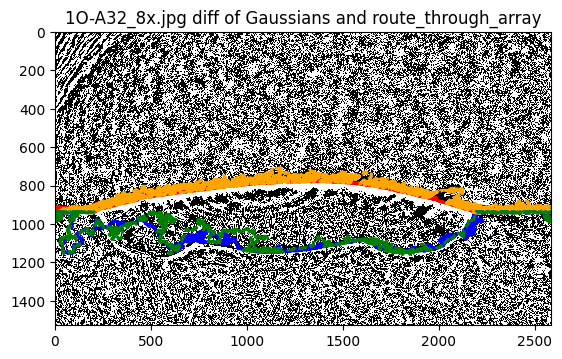

In [16]:

for fname in images:
    g1 = 1
    g2 = 18
    hl_l = df.hline_left[df.image_file_name == fname].values[0]
    hl_r = df.hline_right[df.image_file_name == fname].values[0]
    if hl_l < 500:
        hl_l, hl_r = 960, 960
    p_top, p_bottom = get_weld_edges(fname, (hl_l, hl_r), gauss1=g1, gauss2=g2)
    p_top_f, p_bottom_f = get_weld_edges(fname, (hl_l, hl_r), gauss1=g1, gauss2=g2, flipped=True)

    image = io.imread(HOME+fname)
    image= si.cut_scale_off(image)
    image= rgb2gray(image)
    
    filtered_image = differenceOfGaussians(image, gaussian1=g1, gaussian2=g2) 

    # replace all negative values with zero - gives black image
    filtered_image[filtered_image < 0] = 0

    # need to scale the magnitude of the values to enhance the detail at the low end
    filtered_image = filtered_image * 300

    # Convert the image to a 0-255 scale.
    filtered_image = 255 * filtered_image
    filtered_image[filtered_image > 255] = 255

    # Convert to integer data type pixels.
    filtered_image = filtered_image.astype(np.uint8)

    filtered_image = filtered_image.astype(bool)
    plt.imshow(filtered_image, cmap='gray', vmin=0, vmax=1, interpolation='none')


    plt.title('{} diff of Gaussians and route_through_array'.format(fname)) 
    plt.plot(p_top[1][0], p_top[0][0], 'go', markersize=12)
    plt.plot(p_top[1][-1], p_top[0][-1], 'go', markersize=12)

    plt.plot(p_top[1], p_top[0], linewidth=2, color='red')
    plt.plot(p_bottom[1], p_bottom[0], linewidth=2, color='blue')
    plt.plot(p_top_f[1], p_top_f[0], '--',linewidth=2, color='orange')
    plt.plot(p_bottom_f[1], p_bottom_f[0], '--', linewidth=2, color='green')
    plt.show()

# Tests using a corner-finder function

In [32]:

def get_corners(path_top:np.ndarray, hl_l:int, hl_r:int):
       top = [path_top[0][np.where(path_top[0] < np.mean([hl_r,hl_l]))],
              path_top[1][np.where(path_top[0] < np.mean([hl_r,hl_l]))]]
       mean_x = top[1].mean()

       top_left_y = top[0][np.where(top[1] < mean_x)]
       top_left_x = top[1][np.where(top[1] < mean_x)]
       top_right_y = top[0][np.where(top[1] > mean_x)]
       top_right_x = top[1][np.where(top[1] > mean_x)]
       
       corner_left = max(top_left_x[np.where(top_left_y == top_left_y.max())])
       corner_right = min(top_right_x[np.where(top_right_y == top_right_y.max())])
       
       return corner_left, corner_right
    

In [35]:
def find_path(filtered_image, hl_l, hl_r, corner_left=0, corner_right=2584, flipped=False):
    """_summary_

    Args:
        filtered_image (np.ndarray): difference of two gaussian blurings image
        hl_l (int): left reference line (Hough-line)
        hl_r (int): right reference line (Hough-line)
        corner_left (int, optional): _description_. Defaults to 0.
        corner_right (int, optional): _description_. Defaults to 2584.
        flipped (bool, optional): _description_. Defaults to False.

    Returns:
        path_top (np.ndarray): The top path that connects the start 
                               and end on the weld
        path_bottom (np.ndarray): The bottom path that connects the
                                  start and end on the weld
    """
    # Extracting the top edge
    if flipped:
        end = (hl_l, 0)
        start = (hl_r, corner_right - corner_left)
    else:    
        start = (hl_l, 0)
        end = (hl_r, corner_right - corner_left)
    cutting_point = max([start[0], end[0]]) + 5


    path, _ = skimage.graph.route_through_array(filtered_image[:cutting_point, corner_left:(corner_right+1)],
                                                start, end, fully_connected=False, geometric=False)
    path_top = np.array(path).transpose()
    path_top[1] = path_top[1] + corner_left


    # Extracting the bottom edge
    cutting_point = min([start[0], end[0]]) - 5
    start = (start[0] - cutting_point, start[1])
    end = (end[0] - cutting_point, end[1])

    path, _ = skimage.graph.route_through_array(filtered_image[cutting_point:, corner_left:(corner_right+1)],
                                                start, end, fully_connected=False, geometric=False)
    path_bottom = np.array(path).transpose()

    # converting back to original coordinates
    path_bottom[0] = path_bottom[0] + cutting_point
    path_bottom[1] = path_bottom[1] + corner_left

    return path_top, path_bottom


In [17]:
fname = images[5]

In [33]:
g1 = 1
g2 = 18
hl_l = df.hline_left[df.image_file_name == fname].values[0]
hl_r = df.hline_right[df.image_file_name == fname].values[0]
if hl_l < 500:
    hl_l, hl_r = 960, 960
    
p_top, p_bottom = get_weld_edges(fname, (hl_l, hl_r), 
                                 gauss1=g1, gauss2=g2)
corner_left, corner_right = get_corners(p_top, hl_l, hl_r)

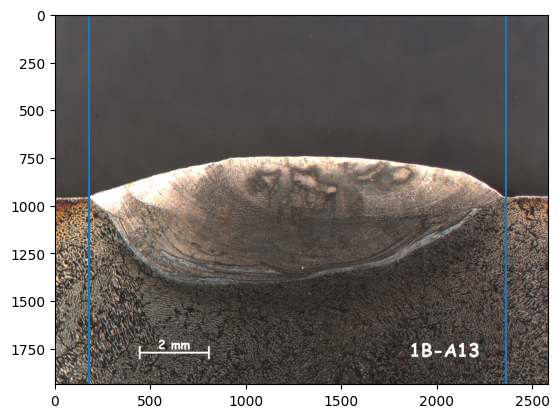

In [34]:
plt.imshow(image)
plt.axvline(corner_left)
plt.axvline(corner_right)

In [36]:

filtered_image = differenceOfGaussians(gray, gauss1, gauss2) 


In [37]:

p_top, p_bottom = find_path(filtered_image, hl_l, hl_r, 
                            corner_left=corner_left, 
                            corner_right=corner_right)

p_top_f, p_bottom_f = find_path(filtered_image, hl_l, hl_r, 
                            corner_left=corner_left, 
                            corner_right=corner_right, flipped=True)

ValueError: no minimum-cost path was found to the specified end point

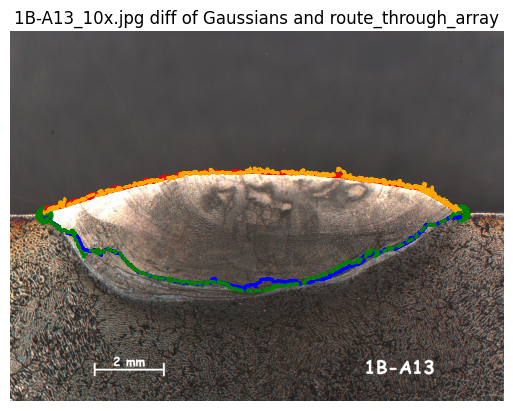

In [ ]:
plt.imshow(image)


plt.title('{} diff of Gaussians and route_through_array'.format(fname)) 
plt.plot(p_top[1][0], p_top[0][0], 'go', markersize=12)
plt.plot(p_top[1][-1], p_top[0][-1], 'go', markersize=12)

plt.plot(p_top[1], p_top[0], linewidth=2, color='red')
plt.plot(p_bottom[1], p_bottom[0], linewidth=2, color='blue')
plt.plot(p_top_f[1], p_top_f[0], '--',linewidth=2, color='orange')
plt.plot(p_bottom_f[1], p_bottom_f[0], '--', linewidth=2, color='green')
plt.axis('off')
plt.show()

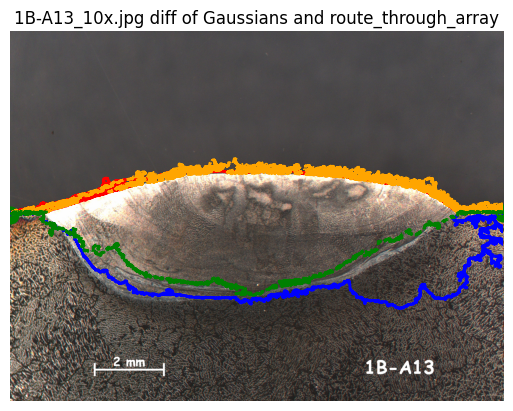

In [18]:


g1 = 1
g2 = 18
hl_l = df.hline_left[df.image_file_name == fname].values[0]
hl_r = df.hline_right[df.image_file_name == fname].values[0]
if hl_l < 500:
    hl_l, hl_r = 960, 960
p_top, p_bottom = get_weld_edges(fname, (hl_l, hl_r), 
                                 gauss1=g1, gauss2=g2)
p_top_f, p_bottom_f = get_weld_edges(fname, (hl_l, hl_r), 
                                     gauss1=g1, gauss2=g2, flipped=True)

image = io.imread(HOME+fname)

plt.imshow(image)


plt.title('{} diff of Gaussians and route_through_array'.format(fname)) 
plt.plot(p_top[1][0], p_top[0][0], 'go', markersize=12)
plt.plot(p_top[1][-1], p_top[0][-1], 'go', markersize=12)

plt.plot(p_top[1], p_top[0], linewidth=2, color='red')
plt.plot(p_bottom[1], p_bottom[0], linewidth=2, color='blue')
plt.plot(p_top_f[1], p_top_f[0], '--',linewidth=2, color='orange')
plt.plot(p_bottom_f[1], p_bottom_f[0], '--', linewidth=2, color='green')
plt.axis('off')
plt.show()

In [19]:
p_top

array([[ 960,  959,  958, ...,  950,  951,  952],
       [   0,    0,    0, ..., 2583, 2583, 2583]])

In [21]:
image.shape

(1936, 2584, 3)

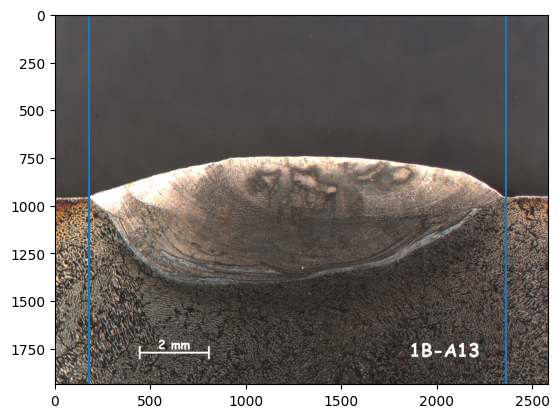

In [22]:
plt.imshow(image)
plt.axvline(corner_left)
plt.axvline(corner_right)

In [23]:

gauss1=1
gauss2=6
buffer=20
flipped=False

image = io.imread(HOME+fname)
image_cropped= si.cut_scale_off(image)
gray= rgb2gray(image_cropped)


In [24]:

filtered_image = differenceOfGaussians(gray, gauss1, gauss2) 


In [27]:

p_top, p_bottom = find_path(filtered_image, hl_l, hl_r, 
                            corner_left=corner_left, 
                            corner_right=corner_right)

p_top_f, p_bottom_f = find_path(filtered_image, hl_l, hl_r, 
                            corner_left=corner_left, 
                            corner_right=corner_right, flipped=True)

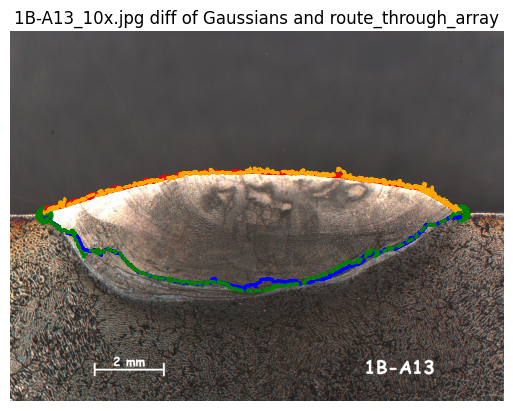

In [30]:
plt.imshow(image)


plt.title('{} diff of Gaussians and route_through_array'.format(fname)) 
plt.plot(p_top[1][0], p_top[0][0], 'go', markersize=12)
plt.plot(p_top[1][-1], p_top[0][-1], 'go', markersize=12)

plt.plot(p_top[1], p_top[0], linewidth=2, color='red')
plt.plot(p_bottom[1], p_bottom[0], linewidth=2, color='blue')
plt.plot(p_top_f[1], p_top_f[0], '--',linewidth=2, color='orange')
plt.plot(p_bottom_f[1], p_bottom_f[0], '--', linewidth=2, color='green')
plt.axis('off')
plt.show()

In [ ]:

g1 = 1
g2 = 18
hl_l = df.hline_left[df.image_file_name == fname].values[0]
hl_r = df.hline_right[df.image_file_name == fname].values[0]
if hl_l < 500:
    hl_l, hl_r = 960, 960
p_top, p_bottom = get_weld_edges(fname, (hl_l, hl_r), 
                                 gauss1=g1, gauss2=g2,
                                 start=(hl_l,corner_left),
                                 end=(hl_r,corner_right))
# p_top_f, p_bottom_f = get_weld_edges(fname, (hl_l, hl_r), 
#                                      gauss1=g1, gauss2=g2, flipped=True)

image = io.imread(HOME+fname)

plt.imshow(image)


plt.title('{} diff of Gaussians and route_through_array'.format(fname)) 
plt.plot(p_top[1][0], p_top[0][0], 'go', markersize=12)
plt.plot(p_top[1][-1], p_top[0][-1], 'go', markersize=12)

plt.plot(p_top[1], p_top[0], linewidth=2, color='red')
plt.plot(p_bottom[1], p_bottom[0], linewidth=2, color='blue')
# plt.plot(p_top_f[1], p_top_f[0], '--',linewidth=2, color='orange')
# plt.plot(p_bottom_f[1], p_bottom_f[0], '--', linewidth=2, color='green')
plt.axis('off')
plt.show()

ValueError: end points must all be within the costs array